## Task4 : EDA on Augmented Data

In [1]:
# Importing needed libraries.

import pandas as pd
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
sns.set_style('darkgrid')
from sklearn.preprocessing import PolynomialFeatures

In [2]:
df = pd.read_csv("Augmented_CementData.csv")
df.head()

,Material Quantity (gm),Additive Catalyst (gm),Ash Component (gm),Water Mix (ml),Plasticizer (gm),Moderate Aggregator,Refined Aggregator,Formulation Duration (hrs),Compression Strength MPa
0,486.42,180.60,21.26,201.66,16.11,1151.17,708.50,344.43,79.89
1,133.32,260.14,185.60,175.99,6.27,1090.57,1010.25,28.86,59.80
2,559.97,2.84,111.76,295.23,11.95,1024.93,810.69,237.68,77.86
3,391.43,351.05,76.39,299.14,19.00,1134.88,881.34,208.81,71.74
4,394.78,352.61,194.35,235.54,17.02,1098.24,781.01,266.84,76.07


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6040 entries, 0 to 6039
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Material Quantity (gm)      6040 non-null   float64
 1   Additive Catalyst (gm)      6040 non-null   float64
 2   Ash Component (gm)          6040 non-null   float64
 3   Water Mix (ml)              6040 non-null   float64
 4   Plasticizer (gm)            6040 non-null   float64
 5   Moderate Aggregator         6040 non-null   float64
 6   Refined Aggregator          6040 non-null   float64
 7   Formulation Duration (hrs)  6040 non-null   float64
 8   Compression Strength MPa    6040 non-null   float64
dtypes: float64(9)
memory usage: 424.8 KB


In [4]:
df.isnull().sum()

Material Quantity (gm)        0
Additive Catalyst (gm)        0
Ash Component (gm)            0
Water Mix (ml)                0
Plasticizer (gm)              0
Moderate Aggregator           0
Refined Aggregator            0
Formulation Duration (hrs)    0
Compression Strength MPa      0
dtype: int64

In [5]:
X = ['Additive Catalyst (gm)','Ash Component (gm)','Plasticizer (gm)']

for col in X:
    mean = df[col].mean()
    df[col].replace(0, mean, inplace=True) 
    
df['Additive Catalyst (gm)'][df['Additive Catalyst (gm)']==0].count()

0

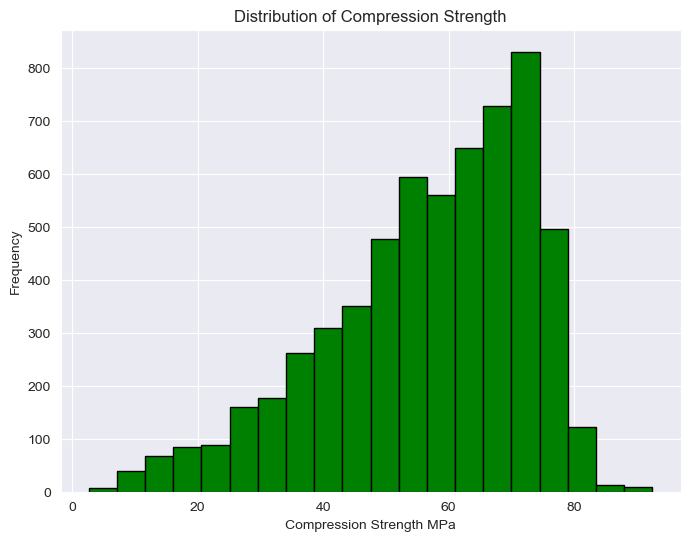

In [6]:
# Exploring Target Variable
target_variable = "Compression Strength MPa"

# Generate histogram to provide an overview of the distribution of DV.

plt.figure(figsize = (8, 6))
plt.hist(df[target_variable], bins=20, edgecolor='k', color = 'green')
plt.xlabel(target_variable)
plt.ylabel('Frequency')
plt.title('Distribution of Compression Strength')
plt.show()

Frequency of Compression Strength is highest for values between 60 - 80 and lowest for values before 10 and after 80.

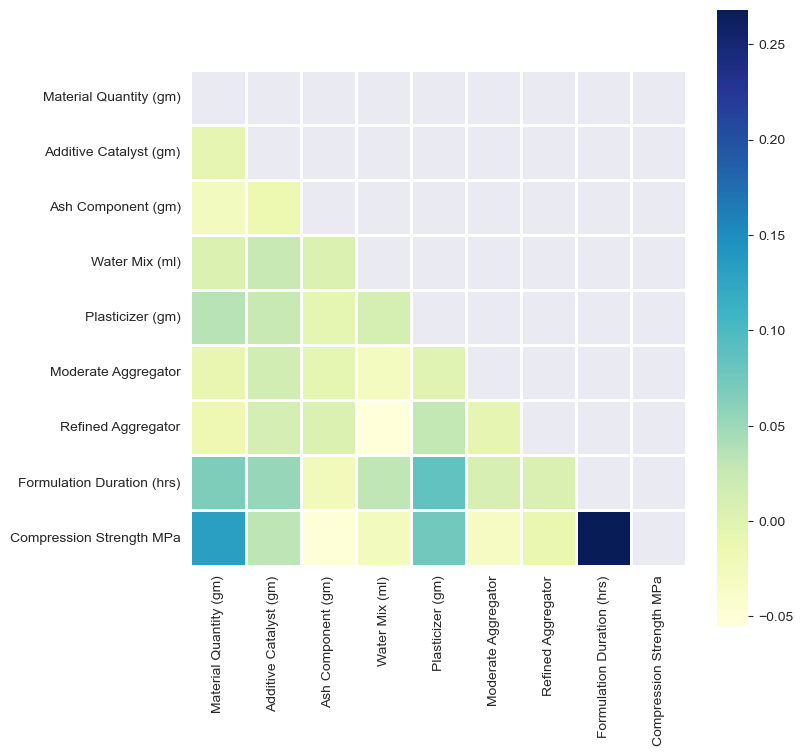

In [7]:
columns = ["Material Quantity (gm)", "Additive Catalyst (gm)", "Ash Component (gm)", "Water Mix (ml)", "Plasticizer (gm)",
           "Moderate Aggregator", "Refined Aggregator", "Formulation Duration (hrs)", "Compression Strength MPa"]

correlation = df[columns].corr()
mask = np.zeros_like(correlation)
mask[np.triu_indices_from(mask)] = True

with sns.axes_style('darkgrid'):
    f, ax =plt.subplots(figsize=(8,8))
    ax = sns.heatmap(correlation, mask=mask, square = True, linewidths = .8, cmap = "YlGnBu")

The target variable i.e Compression Strength MPa seesms to be highly correlated with Formulation Duration & Material Quantity (gm).

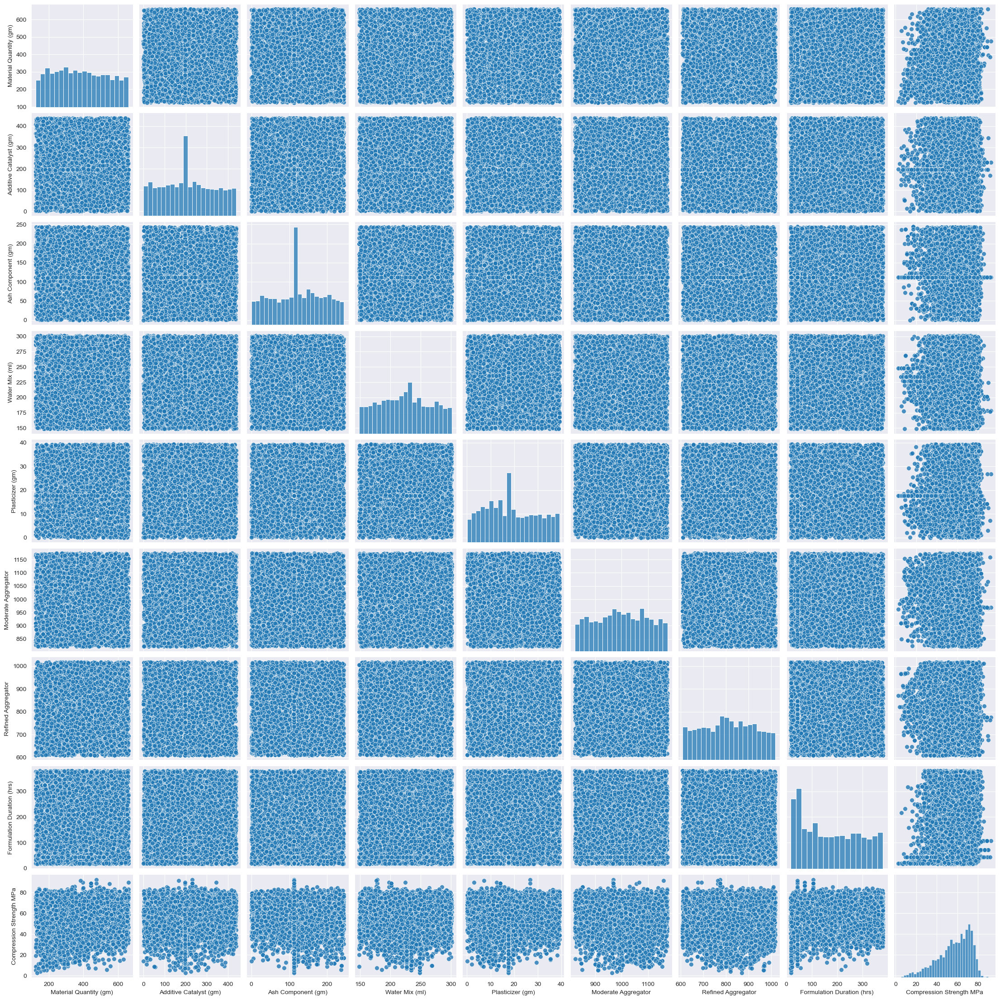

In [8]:
sns.pairplot(df[columns], plot_kws=dict(s=50, alpha=0.8), markers=['^'])

There isn't any specific pattern which means no significant relation between these columns. But just slight difference with Compression Strength MPa Column.

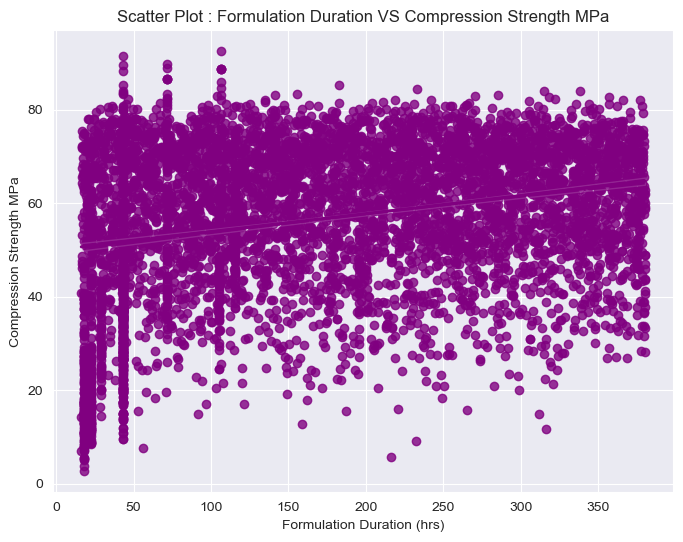

In [9]:
x = "Formulation Duration (hrs)"
y = "Compression Strength MPa"

plt.figure(figsize=(8,6))
sns.regplot(data=df, x=x, y=y, color = "purple")
plt.xlabel(x)
plt.ylabel(y)
plt.title("Scatter Plot : Formulation Duration VS Compression Strength MPa")
plt.show()

As Formulation Duration increases the Compression Strength MPa is still between 60 - 80.

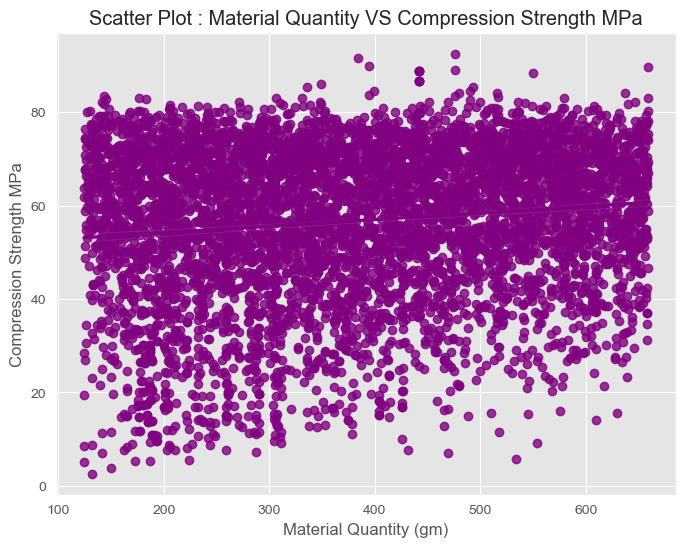

In [15]:
x = "Material Quantity (gm)"
y = "Compression Strength MPa"

plt.figure(figsize=(8,6))
sns.regplot(data=df, x=x, y=y, color = "purple")
plt.xlabel(x)
plt.ylabel(y)
plt.title("Scatter Plot : Material Quantity VS Compression Strength MPa")
plt.show()

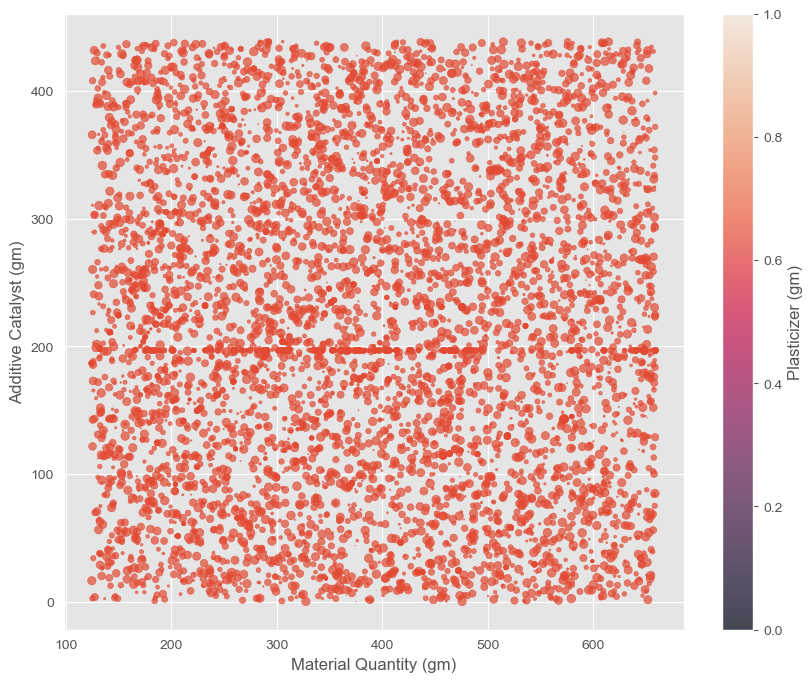

In [16]:
# Separating the cloumns by their units and comparing them with target variable

X = ['Material Quantity (gm)', 'Additive Catalyst (gm)', 'Ash Component (gm)', 'Plasticizer (gm)']
y = ['Compression Strength MPa']

plt.figure(figsize=(10,8))
plt.scatter(df['Material Quantity (gm)'], df['Additive Catalyst (gm)'], s=df['Plasticizer (gm)'], cmap='viridis', alpha=0.7) # s=df['Compression Strength MPa']
plt.xlabel('Material Quantity (gm)')
plt.ylabel('Additive Catalyst (gm)')
plt.colorbar(label = 'Plasticizer (gm)')
plt.style.use('ggplot')
plt.show()

In [18]:
# Applying feature engineering technique to capture any hidden patterns in the data.

columns =  ['Material Quantity (gm)', 'Refined Aggregator', 'Additive Catalyst (gm)', 'Ash Component (gm)',
           'Water Mix (ml)', 'Plasticizer (gm)', 'Moderate Aggregator', 'Formulation Duration (hrs)']

# create polynomial features
poly = PolynomialFeatures(degree=2, include_bias=False)
poly_features = poly.fit_transform(df[columns].values)

poly_columns = poly.get_feature_names(columns)
df_poly = pd.DataFrame(poly_features, columns=poly_columns)
df = pd.concat([df,df_poly], axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6040 entries, 0 to 6039
Data columns (total 53 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   Material Quantity (gm)                             6040 non-null   float64
 1   Additive Catalyst (gm)                             6040 non-null   float64
 2   Ash Component (gm)                                 6040 non-null   float64
 3   Water Mix (ml)                                     6040 non-null   float64
 4   Plasticizer (gm)                                   6040 non-null   float64
 5   Moderate Aggregator                                6040 non-null   float64
 6   Refined Aggregator                                 6040 non-null   float64
 7   Formulation Duration (hrs)                         6040 non-null   float64
 8   Compression Strength MPa                           6040 non-null   float64
 9   Material

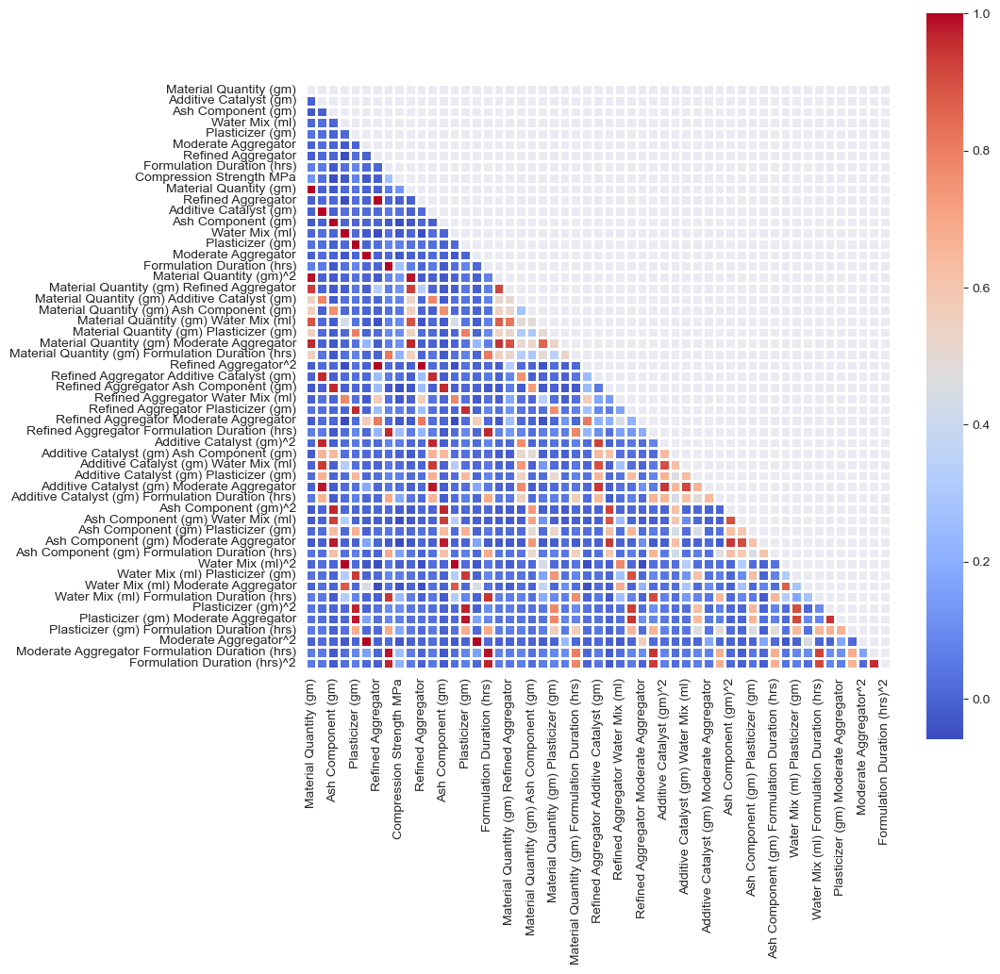

In [20]:
correlation = df.corr()
mask = np.zeros_like(correlation)
mask[np.triu_indices_from(mask)] = True

with sns.axes_style("dark"):
    f, ax = plt.subplots(figsize=(10,10))
    ax = sns.heatmap(correlation, mask=mask, square=True, linewidths=.8, cmap="coolwarm")

In [21]:
df.to_csv("Processed_CementData.csv", index=False)